# Radio Arroyo

Autor: Eli José Cuavas Arroyo. TIP: 1007675766.

# Carga de audios a transmitir:

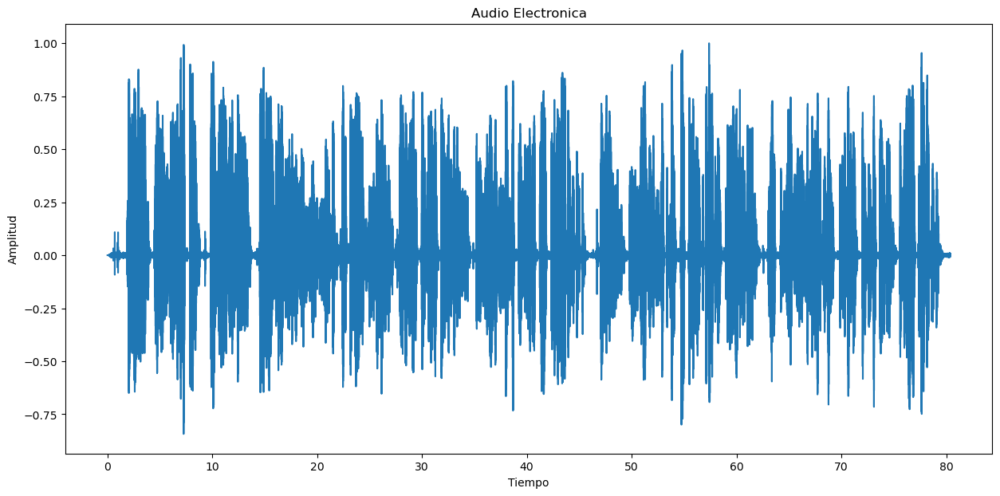

16000


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io.wavfile import read
from IPython.display import Audio  #para escuchar la señal

file_audio_e=('electronica.wav')
file_audio_b=('bio.wav')
file_audio_i=('industria.wav')

fs_e, signal_e=read(file_audio_e)
fs_b, signal_b=read(file_audio_b)  
fs_i, signal_i=read(file_audio_i)  

# Normalizacion:
signal_e=signal_e/float(max(abs(signal_e)))
signal_b=signal_b/float(max(abs(signal_b))) 
signal_i=signal_i/float(max(abs(signal_i)))

t_e=np.arange(0,float(len(signal_e))/fs_e, 1/fs_e)
t_b=np.arange(0,float(len(signal_b))/fs_b, 1/fs_b) 
t_i=np.arange(0,float(len(signal_i))/fs_i, 1/fs_i)  

#signal_e = np.cos(2*np.pi*1000*t_e)
# Audio electronica
plt.figure(figsize=(15,7))
plt.plot(t_e,signal_e) 
plt.title('Audio Electronica')
plt.xlabel('Tiempo')
plt.ylabel('Amplitud')
plt.show()
print(fs_e)
Audio(signal_e,rate=fs_e)

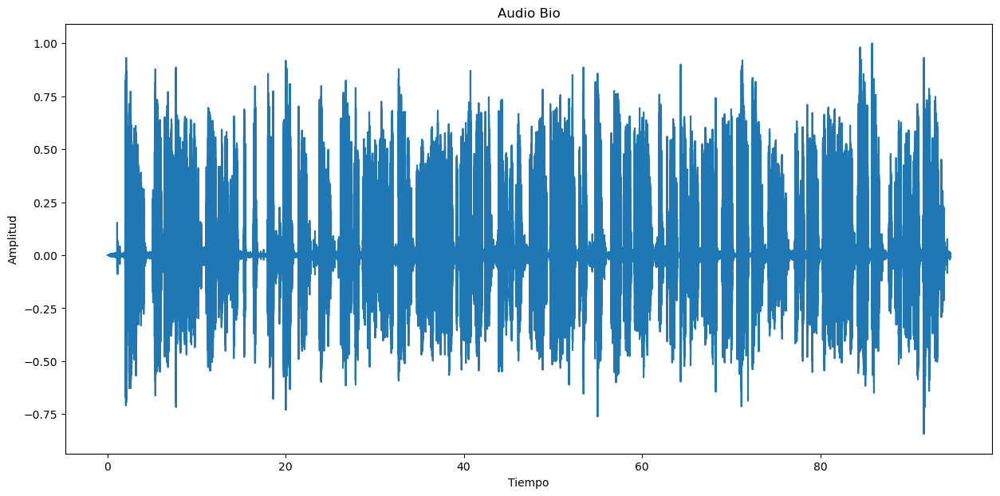

16000


In [3]:
# Audio bio
plt.figure(figsize=(15,7))
plt.plot(t_b,signal_b) 
plt.title('Audio Bio')
plt.xlabel('Tiempo')
plt.ylabel('Amplitud')
plt.show()
print(fs_b)
Audio(signal_b,rate=fs_b)

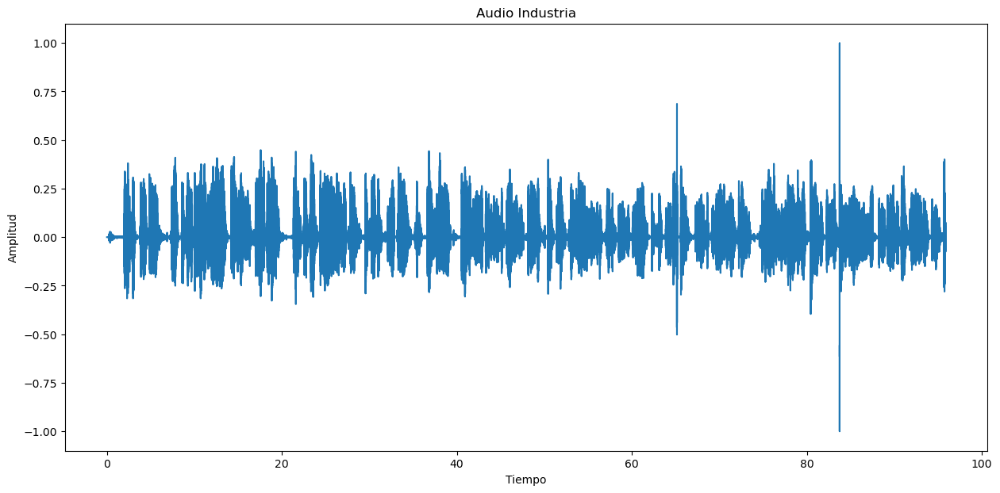

16000


In [4]:
# Audio industria
plt.figure(figsize=(15,7))
plt.plot(t_i,signal_i) 
plt.title('Audio Industria')
plt.xlabel('Tiempo')
plt.ylabel('Amplitud')
plt.show()
print(fs_i)
Audio(signal_i,rate=fs_i)

# Espectro de los audios:

In [5]:
def spectrum (signal,t,title):

    SIGNAL = np.fft.fft(signal)
    SIGNAL = np.fft.fftshift(SIGNAL)
    freq = np.fft.fftfreq(len(signal),d = t[1]-t[0])
    freq = np.fft.fftshift(freq)
    AMP = (1/len(signal)*abs(SIGNAL)) # Normalizacion

    plt.figure(figsize=(12,5))
    plt.plot(freq,AMP)
    plt.title(title)
    plt.xlabel("Frecuencia [Hz]")
    plt.ylabel("Amplitud")
    plt.grid()
    plt.show()

    #print(len(AMP))
    #print(len(freq))
    
    data = [freq, AMP]
    
    return data

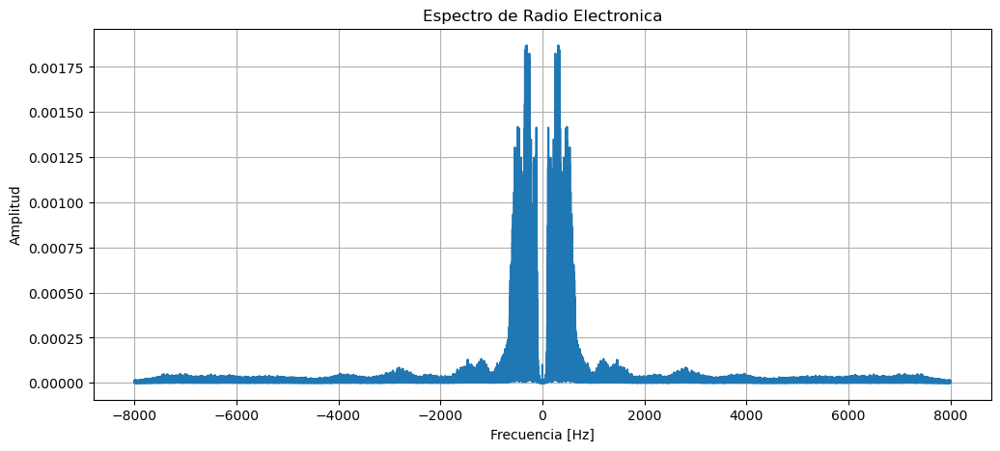

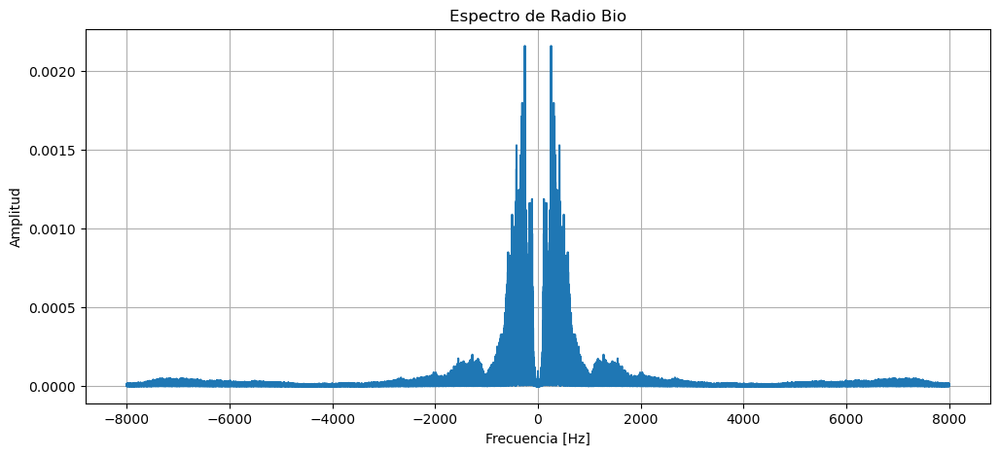

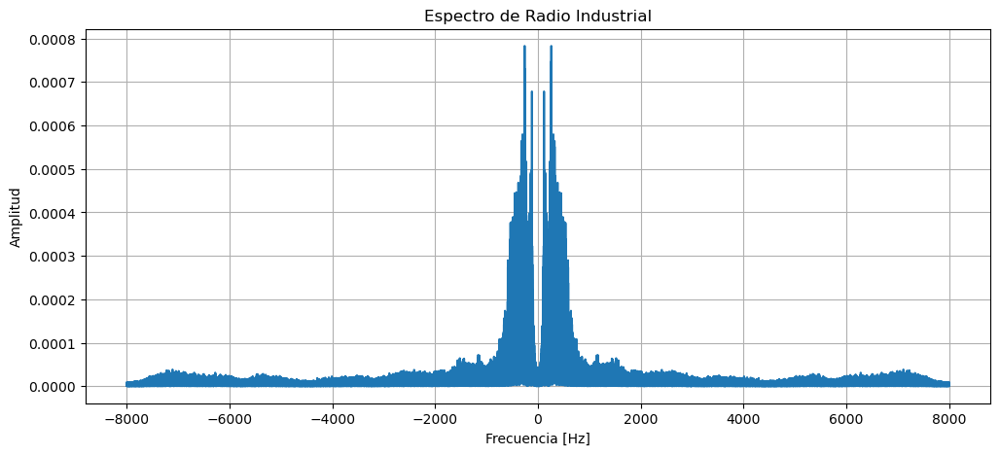

In [6]:
data_Fourier_e = spectrum(signal_e,t_e,"Espectro de Radio Electronica")
data_Fourier_b = spectrum(signal_b,t_b,"Espectro de Radio Bio")
data_Fourier_i = spectrum(signal_i,t_i,"Espectro de Radio Industrial")

# Ahora un poco de teoría de la modulación AM doble banda lateral suprimida:

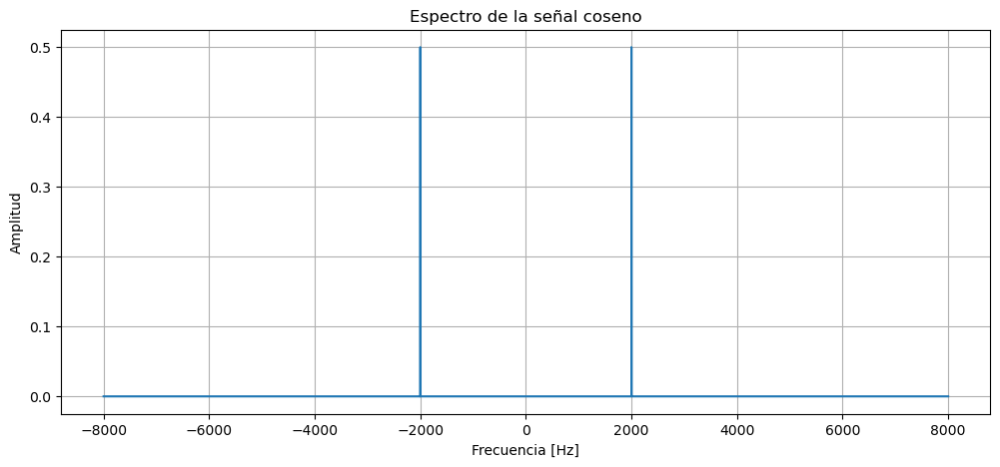

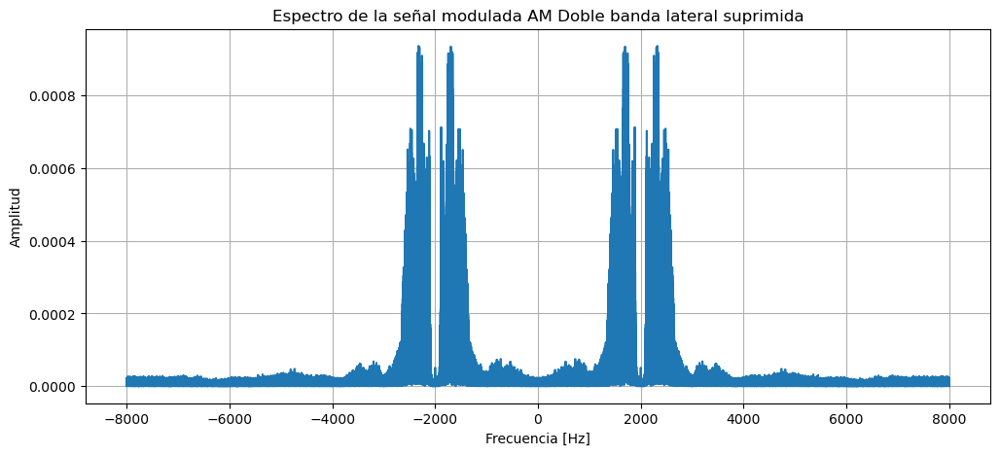

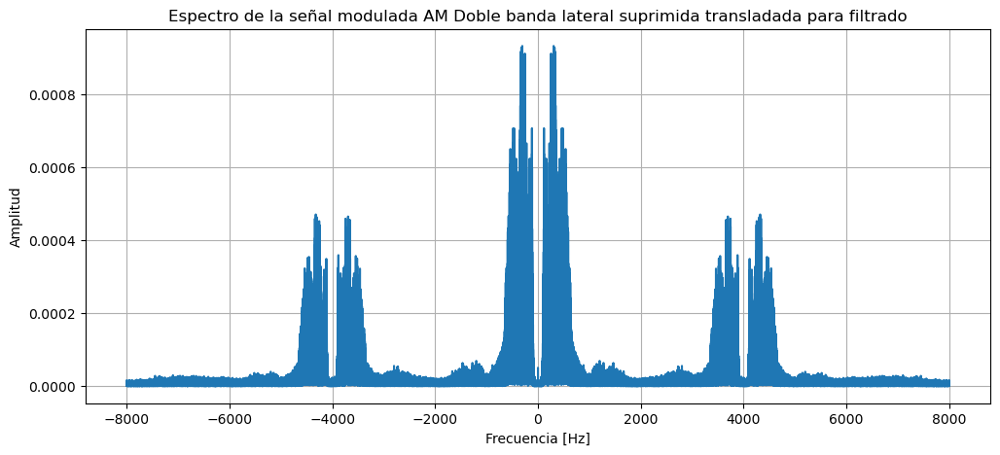

In [7]:
fp_x = 2000
portadora_x = np.cos(2*np.pi*fp_x*t_e)
data_Fourier_x = spectrum(portadora_x,t_e,"Espectro de la señal coseno")

Xam_ps_ex =signal_e*portadora_x
data_Fourier_ex = spectrum(Xam_ps_ex,t_e,"Espectro de la señal modulada AM Doble banda lateral suprimida")

Xam_ps_exx =Xam_ps_ex*portadora_x
data_Fourier_ex = spectrum(Xam_ps_exx,t_e,"Espectro de la señal modulada AM Doble banda lateral suprimida transladada para filtrado")

# Modulación AM doble banda lateral suprimida:

In [8]:
def spectrum_move (signal,t,fp,bw,title):

    f = np.fft.fft(signal)
    f = np.fft.fftshift(f)
    freq = np.fft.fftfreq(len(signal),d = t[1]-t[0])
    freq = np.fft.fftshift(freq)
    amp = (1/len(signal)*abs(f))

    criterio = 20
    freq_inf = fp-(bw/2)-criterio
    freq_sup = fp+(bw/2)+criterio

    point_freq_inf = 0
    point_freq_sup = 0

    delta = 0.5
    for i in range(len(freq)):
        if((freq[i] >= freq_inf-delta)and(freq[i] < freq_inf+delta)):
            point_freq_inf = i
        if((freq[i] >= freq_sup-delta)and(freq[i] < freq_sup+delta)):
            point_freq_sup = i

    freq = freq[point_freq_inf:(point_freq_sup+1)]
    amp = amp[point_freq_inf:(point_freq_sup+1)]

    plt.figure(figsize=(12,5))
    plt.plot(freq,amp)
    plt.xlim(freq_inf,freq_sup)
    plt.title(title)
    plt.xlabel("Frecuencia [Hz]")
    plt.ylabel("Amplitud")
    plt.grid()

fp_e = 1300.0
fp_b = 3850.0
fp_i = 6400.0


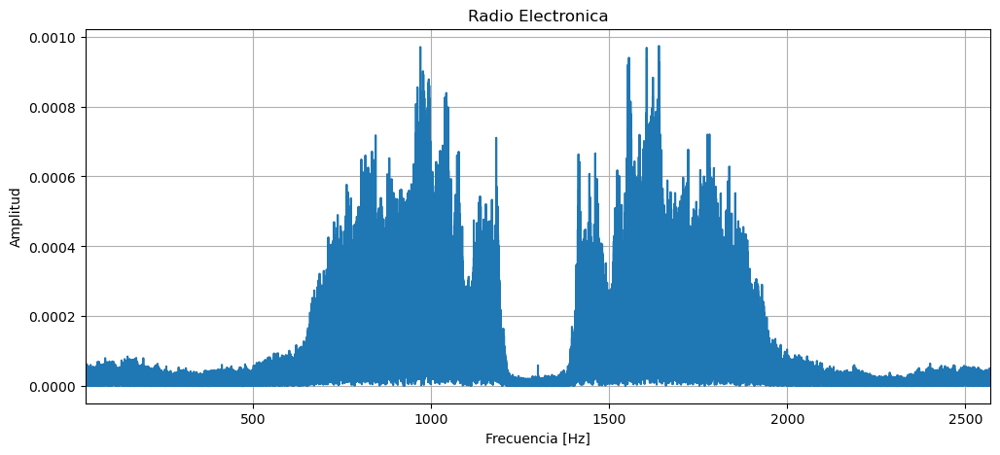

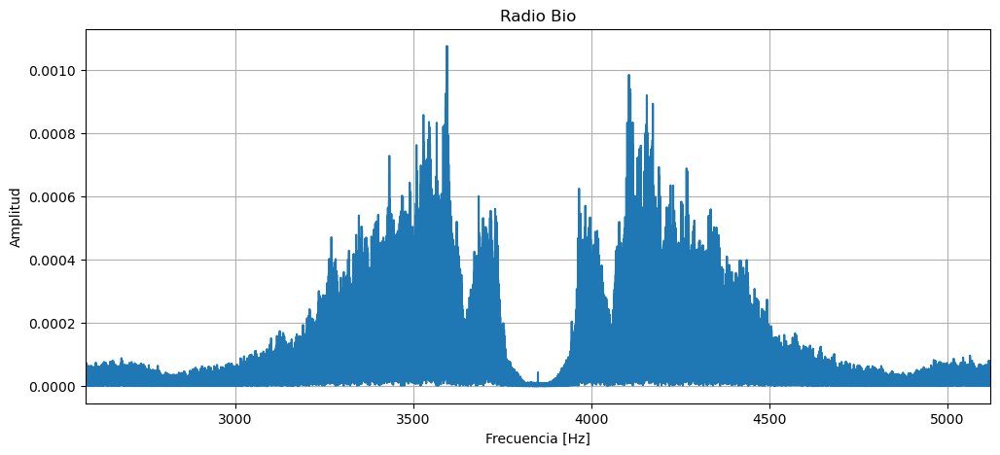

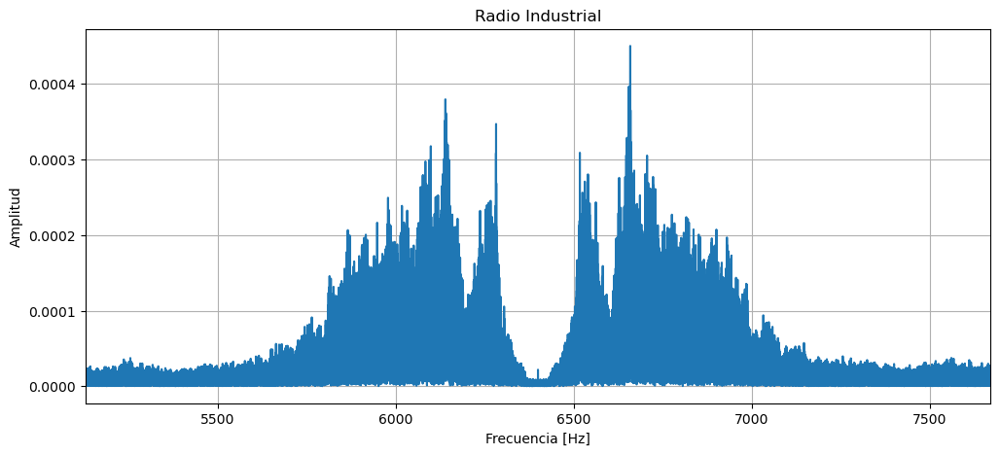

In [9]:
# Contexto, el espectro es de 0-8000Hz
# Cada espectro,tendra un ancho de banda de Bw=2500Hz, para obtener los armonicos de alta potencia y eliminar el ruido de alta frecuencia.
# Criterio para el ancho de banda Bw=2*fc, fc= 1250Hz
# Dejando un espacio de 50Hz entre los espectros y partiendo desde 50Hz en el espectro, definimos las frecuencias de las portadoras.
delta = 50
bw = 2500
reference = 50

fp_e = reference+bw/2
fp_b = fp_e+delta+bw
fp_i = fp_b+delta+bw

# Preparamos las señales portadoras:
portadora_e = np.cos(2*np.pi*fp_e*t_e)
portadora_b = np.cos(2*np.pi*fp_b*t_b)
portadora_i = np.cos(2*np.pi*fp_i*t_i)

# Hacemos las modulacion:
Xam_ps_e=(signal_e)*(portadora_e)
Xam_ps_b=(signal_b)*(portadora_b)
Xam_ps_i=(signal_i)*(portadora_i)

# Mostramos en el espectro:
data_Fourier_e_m = spectrum_move(Xam_ps_e,t_e,fp_e,bw,"Radio Electronica")
print("fp_e = "+str(fp_e))
data_Fourier_b_m = spectrum_move(Xam_ps_b,t_b,fp_b,bw,"Radio Bio")
print("fp_b = "+str(fp_b))
data_Fourier_i_m = spectrum_move(Xam_ps_i,t_i,fp_i,bw,"Radio Industrial")
print("fp_i = "+str(fp_i))

# Espectro de señales moduladas:

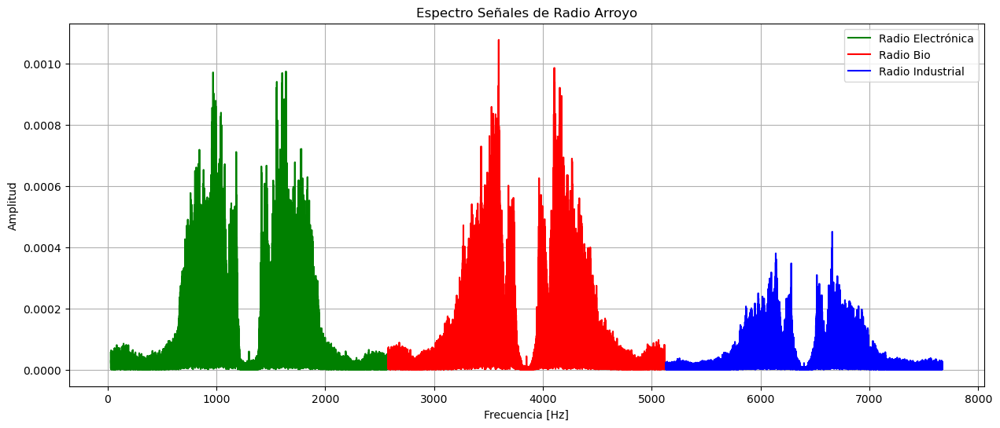

In [10]:
def spectrum_until (signal,t,fp,bw,color,name):
    f = np.fft.fft(signal)
    f = np.fft.fftshift(f)
    freq = np.fft.fftfreq(len(signal),d = t[1]-t[0])
    freq = np.fft.fftshift(freq)
    amp = (1/len(signal)*abs(f))

    criterio = 20
    freq_inf = fp-(bw/2)-criterio
    freq_sup = fp+(bw/2)+criterio

    point_freq_inf = 0
    point_freq_sup = 0

    delta = 0.5
    for i in range(len(freq)):
        if((freq[i] >= freq_inf-delta)and(freq[i] < freq_inf+delta)):
            point_freq_inf = i
        if((freq[i] >= freq_sup-delta)and(freq[i] < freq_sup+delta)):
            point_freq_sup = i

    freq = freq[point_freq_inf:(point_freq_sup+1)]
    amp = amp[point_freq_inf:(point_freq_sup+1)]

    plt.plot(freq,amp,color,label = name)
    plt.legend()

plt.figure(figsize=(15,6))

spectrum_until(Xam_ps_e,t_e,fp_e,bw,'g',"Radio Electrónica")
spectrum_until(Xam_ps_b,t_b,fp_b,bw,'r',"Radio Bio")
spectrum_until(Xam_ps_i,t_i,fp_i,bw,'b',"Radio Industrial")

plt.xlabel("Frecuencia [Hz]")
plt.ylabel("Amplitud")
plt.title("Espectro Señales de Radio Arroyo")
plt.grid()
plt.show()


# Demodulación:

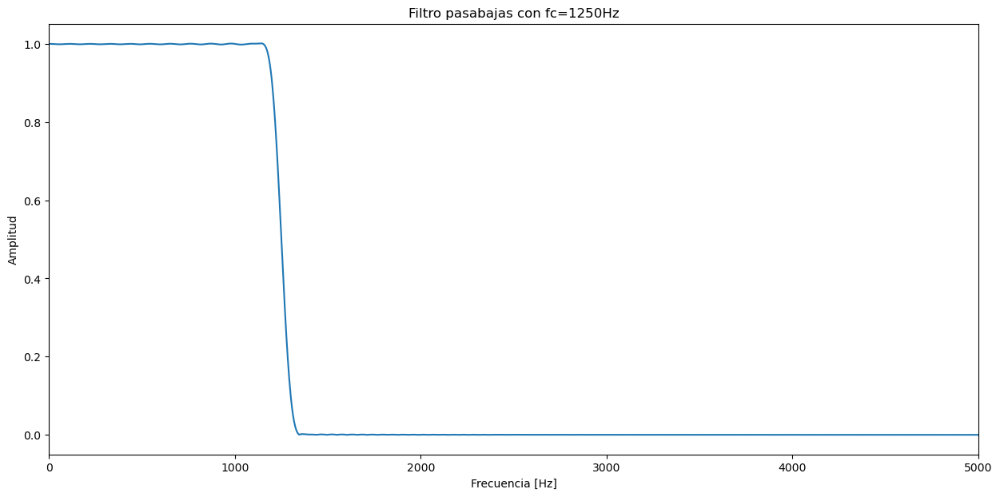

In [13]:
# Preparamos un filtro pasa-bajas para realizar la demodulacion:
from scipy.signal import kaiserord, lfilter, firwin, freqz
import scipy.signal as signal

nyq_rate = fs_e / 2.0
roll_off = 200.0
cutoff_hz = 1250.0 # Tiene que ser esta debido al ancho de banda Bw= 2500
width = roll_off/nyq_rate
ripple_db = 60.0 #The desired attenuation in the stop band, in dB.
N,_= kaiserord(ripple_db, width) # Compute the order and Kaiser parameter for the FIR filter.
taps = firwin(N, cutoff_hz/nyq_rate, pass_zero='lowpass')
w, h = signal.freqz(taps, [1], worN=2000)
plt.figure(figsize=(15,7))
plt.plot(nyq_rate*w/np.pi, np.abs(h))
plt.xlim([0, 5000])
plt.title('Filtro pasabajas con fc=1250Hz')
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.show()

# Demodulacion:
def demodulador_AM(frequency):
    if ((frequency >= (50))and(frequency < (2575))):
        Xam_ps = Xam_ps_e
        portadora = portadora_e
        t = t_e
    elif ((frequency >= (2575))and(frequency < (5125))):
        Xam_ps = Xam_ps_b
        portadora = portadora_b
        t=t_b
    elif ((frequency >= (5125))and(frequency <= (7675))):
        Xam_ps = Xam_ps_i
        portadora = portadora_i
        t=t_i
        
    # Sincronismo:
    sincrone_AM = Xam_ps*portadora
    
    # Filtrado:
    filtered_AM = lfilter(taps, 1.0, sincrone_AM)
    filtered_AM = 2*filtered_AM# Se repone la potencia perdida

    return [t,filtered_AM]

# Producto final: Radio Arroyo

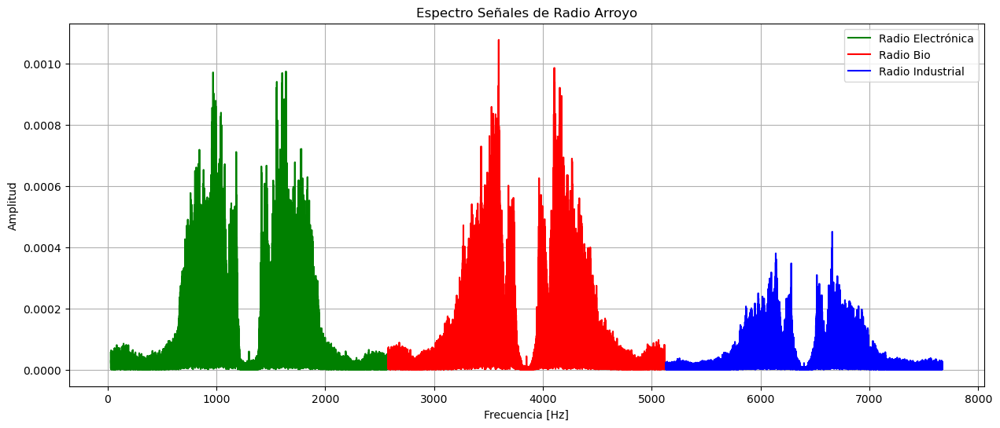

Ingresa una frecuencia en el rango 50-7650 Hz: 4500


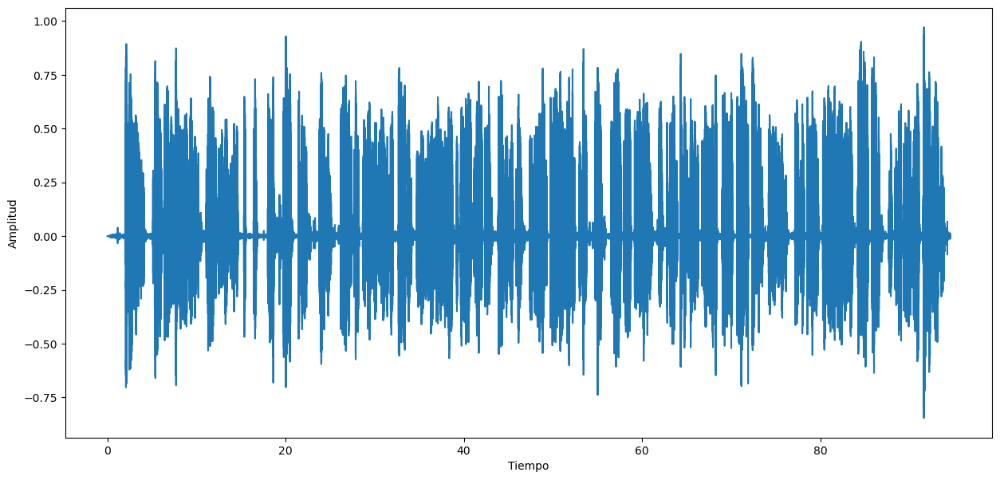

In [21]:
# Programa principal

# Visualizacion del espectro de la emisora
plt.figure(figsize=(15,6))
spectrum_until(Xam_ps_e,t_e,fp_e,bw,'g',"Radio Electrónica")
spectrum_until(Xam_ps_b,t_b,fp_b,bw,'r',"Radio Bio")
spectrum_until(Xam_ps_i,t_i,fp_i,bw,'b',"Radio Industrial")
plt.xlabel("Frecuencia [Hz]")
plt.ylabel("Amplitud")
plt.title("Espectro Señales de Radio Arroyo")
plt.grid()
plt.show()

# Programa main:
f = int(input("Ingresa una frecuencia en el rango 50-7650 Hz: "))
if ((f>49)and(f<7676)):
    data = demodulador_AM(f)
    signal = data[1]
    time = data[0]
    plt.figure(figsize=(15,7))
    plt.plot(time,signal)  #graficacion
    plt.xlabel('Tiempo')
    plt.ylabel('Amplitud')
    plt.show()
else:
    print("Frecuencia invalida")
Audio(signal,rate=fs_e)  #para escuchar la señal si se desea